# **Football Data Analysis**

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn
import plotly.express as px
import missingno as msno

# **Data Profiling and Cleaning**

Data profiling is a crucial first step in understanding the characteristics and quality of any dataset. This section presents a thorough profile of the dataset, summarizing its key statistics, identifying potential issues, and highlighting patterns within the data.

## DataSet

Let's introduce the key data tables we'll be working with:

- matches_results: This table holds the core information about each match, including start time, tournament, the teams involved, and the final results.

- matches_statistics:  Dive deeper with match-specific statistics in this table, like possession percentages, shots on goal, and more.

- matches_highlights:  This table offers a timeline of important events that occurred within each match, adding valuable context.

Source: All of this rich data has been carefully scraped from Sofascore: [Sofascore](https://www.sofascore.com), a leading website for football statistics and analysis.

## Matches Results DataFrame

In [4]:
results_df = pd.read_csv("football_data/matches_results.csv", parse_dates=["startTimestamp"])
results_df.sample()

,id,customId,startTimestamp,season,country,tournament,round_s,home_team,away_team,home_score,away_score,winner_code,home_country,away_country,is_homeTeam_national,is_awayTeam_national
649,8738732,lIsDI,2021-01-31 12:00:00+00:00,20/21,France,Ligue 1,22,Nice,Saint-Étienne,0.0,1.0,2.0,France,France,False,False


matches_results schema

In [5]:
results_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30718 entries, 0 to 30717
Data columns (total 16 columns):
 #   Column                Non-Null Count  Dtype              
---  ------                --------------  -----              
 0   id                    30718 non-null  int64              
 1   customId              30718 non-null  object             
 2   startTimestamp        30718 non-null  datetime64[ns, UTC]
 3   season                30718 non-null  object             
 4   country               30718 non-null  object             
 5   tournament            30718 non-null  object             
 6   round_s               30718 non-null  object             
 7   home_team             30718 non-null  object             
 8   away_team             30718 non-null  object             
 9   home_score            30716 non-null  float64            
 10  away_score            30716 non-null  float64            
 11  winner_code           30717 non-null  float64            
 12  home

- id: A unique identifier for each match.

- customId: A Sofascore-specific ID used in match URLs.

- startTimestamp: The date and time the match began.

- season: The season during which the match took place.

- country: The country where the league or tournament is held.

- tournament: The name of the specific league or tournament.

- round_s: The stage of the competition (*e.g.*, regular season round, final, quarter-final).

- home_team: The name of the team playing at their home stadium.

- away_team: The name of the team playing away from their home stadium.

- home_score and away_score: The final scores for each team.

- winner_code: Indicates the winner or a draw:

* 1: Home team victory
* 2: Away team victory
* 3: Draw

- home_country and away_country: The respective countries of origin for the home and away teams.





### Redundancy

let's make sure that there is no redundancy in matches_results dataframe.

In [6]:
results_df.duplicated().sum()

0

Good! as there is no redundancy we can now pass to the next step.

### Missing Values

In [7]:
results_df[results_df.isna().any(axis=1)]

,id,customId,startTimestamp,season,country,tournament,round_s,home_team,away_team,home_score,away_score,winner_code,home_country,away_country,is_homeTeam_national,is_awayTeam_national
5080,4221317,pLnsuOn,2013-10-04 17:05:00+00:00,13/14,Saudi Arabia,Saudi Pro League,6,Al-Ahli,Al-Ittihad,NaN,NaN,NaN,Saudi Arabia,Saudi Arabia,False,False
18701,1966981,AaxsKax,2011-12-27 19:00:00+00:00,11/12,Morocco,Botola Pro,13,CODM Meknès,MAS de Fès,NaN,NaN,3.0,Morocco,Morocco,False,False


As we can see, there is just two rows containing null values. let's drop this rows.

In [8]:
results_df.dropna(axis=0, inplace=True)
results_df.isna().sum(axis=0)

id                      0
customId                0
startTimestamp          0
season                  0
country                 0
tournament              0
round_s                 0
home_team               0
away_team               0
home_score              0
away_score              0
winner_code             0
home_country            0
away_country            0
is_homeTeam_national    0
is_awayTeam_national    0
dtype: int64

now, there is no missing values in our table, let's pass to the next step that consist to correct the dtype of each field.

### Correct Data Type

those are the modification that we will achieve to correct the data type in "matches_results" dataframe:
- convert "home_score" field type into "int8"
- convert "away_score" field type into "int8"
- extract from "winner_code"  a field that indicate the name of winner club instead of the code of winner.

In [9]:
results_df["home_score"] = results_df["home_score"].astype("int8")
results_df["away_score"] = results_df["away_score"].astype("int8")
results_df["winner_code"] = results_df["winner_code"].astype("int8")
results_df.dtypes

id                                    int64
customId                             object
startTimestamp          datetime64[ns, UTC]
season                               object
country                              object
tournament                           object
round_s                              object
home_team                            object
away_team                            object
home_score                             int8
away_score                             int8
winner_code                            int8
home_country                         object
away_country                         object
is_homeTeam_national                   bool
is_awayTeam_national                   bool
dtype: object

In [10]:
def get_winner(match):
    winner_code = match["winner_code"]
    if winner_code == 1:
        return match["home_team"]
    elif winner_code == 2:
        return match["away_team"]
    else:
        return "draw"

results_df["winner"] = results_df.apply(get_winner, axis=1)
results_df.sample(5)

,id,customId,startTimestamp,season,country,tournament,round_s,home_team,away_team,home_score,away_score,winner_code,home_country,away_country,is_homeTeam_national,is_awayTeam_national,winner
5038,2842011,UjnsuOn,2012-09-02 17:35:00+00:00,12/13,Saudi Arabia,Saudi Pro League,5,Al-Ahli,Al-Wehda,2,1,1,Saudi Arabia,Saudi Arabia,False,False,Al-Ahli
14396,7127764,wgbsAgb,2017-04-30 18:45:00+00:00,16/17,Spain,LaLiga,35,Celta Vigo,Athletic Club,0,3,2,Spain,Spain,False,False,Athletic Club
14330,11453012,wvxsxlrb,2023-10-05 15:00:00+00:00,23/24,Saudi Arabia,Saudi Pro League,9,Al-Taawoun,Al Tai,3,0,1,Saudi Arabia,Saudi Arabia,False,False,Al-Taawoun
6542,4768768,GObshVb,2014-06-25 20:00:00+00:00,2014,World,World Championship,3,Ecuador,France,0,0,3,Ecuador,France,True,True,draw
22267,6768335,Gskb,2016-01-02 15:00:00+00:00,15/16,England,Premier League,20,Leicester City,Bournemouth,0,0,3,England,England,False,False,draw


### Matches Distribution
Let's see how many scraped matches we have for each country.

In [11]:
matches_dist = results_df.groupby("country")["id"] \
                         .count() \
                         .sort_values(ascending=False) \
                         .rename("match count")
fig = px.bar(matches_dist, x=matches_dist.index, y="match count", color=matches_dist.index, title="Matches Distribution")
fig.update_layout(
    yaxis_title="Matches count"
    )
fig.show()


NB: world represent an international competition as "World Cup"

### Scraped Time Range

In [14]:
results_df["startTimestamp"].describe()

count                                  30716
mean     2017-07-20 04:01:04.902982144+00:00
min                2010-08-07 19:00:00+00:00
25%                2014-02-08 15:00:00+00:00
50%                2017-09-09 13:30:00+00:00
75%                2021-01-17 14:07:30+00:00
max                2024-03-20 22:00:00+00:00
Name: startTimestamp, dtype: object

Let's now discover the earliest and the latest matches

In [15]:
earliest_match_time = results_df["startTimestamp"].min()
results_df[results_df["startTimestamp"] == earliest_match_time].sample()

,id,customId,startTimestamp,season,country,tournament,round_s,home_team,away_team,home_score,away_score,winner_code,home_country,away_country,is_homeTeam_national,is_awayTeam_national,winner
265,1369974,YHsAI,2010-08-07 19:00:00+00:00,10/11,France,Ligue 1,1,Lens,Nancy,1,2,2,France,France,False,False,Nancy


In [16]:
latest_match_time = results_df["startTimestamp"].max()
results_df[results_df["startTimestamp"] == latest_match_time].sample()

,id,customId,startTimestamp,season,country,tournament,round_s,home_team,away_team,home_score,away_score,winner_code,home_country,away_country,is_homeTeam_national,is_awayTeam_national,winner
15524,12167163,KaxsVhH,2024-03-20 22:00:00+00:00,23/24,Morocco,Botola Pro,22,RS Berkane,MAS de Fès,2,1,1,Morocco,Morocco,False,False,RS Berkane


### Winner_code Field's Distribution

In [17]:
categories = {
    1: "home team",
    2: "away team",
    3: "draw"
}

winners_count = results_df \
                .groupby("winner_code")["id"] \
                .count() \
                .rename("win times") \


winners_count.index = winners_count.index.map(categories)


In [18]:
fig = px.pie(winners_count, names=winners_count.index, values="win times", title="Win Proportion")
fig.show()

According to the pie chart above, it's clear tha t mostly the home team win the game with a percentage of 44.7%.

### Home Score vs Away Score

In [19]:
stats = results_df[["home_score", "away_score"]] \
          .describe() \
          .loc[["min", "mean","max"]]

px.bar(
      stats, x= stats.index,
       y=["home_score", "away_score"],
       barmode="group",
       title="Home Score VS Away Score"
  )

### National Team vs Club

now let's visualize the proportion of national team in the scraped data.

In [20]:
national_team_count = (
    results_df["is_homeTeam_national"].sum() +
    results_df["is_awayTeam_national"].sum()
)

club_count = results_df["id"].count() - national_team_count
fig = px.pie(names = ["national team", "club"], values=[national_team_count, club_count])
fig.show()

### Save the Preprocessed Data

In [21]:
results_df.to_csv("football_data/clean_matches_results.csv", index=False)

## Matches Statistics DataFrame

In [22]:
matches_statistics = pd.read_csv("football_data/matches_statistics.csv")
matches_statistics.tail(1)

,id,home_expected_goals,away_expected_goals,home_possession,away_possession,home_total_shots,away_total_shots,home_shots_on_target,away_shots_on_target,home_shots_off_target,...,home_duels_won,away_duels_won,home_aerials_won,away_aerials_won,home_tackles,away_tackles,home_interceptions,away_interceptions,home_clearances,away_clearances
30717,11396360,1.0,2.0,35.0,65.0,14.0,14.0,6.0,4.0,4.0,...,50.0,50.0,7.0,15.0,28.0,14.0,8.0,12.0,28.0,10.0


In [23]:
matches_statistics.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30718 entries, 0 to 30717
Data columns (total 71 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   id                         30718 non-null  int64  
 1   home_expected_goals        3408 non-null   float64
 2   away_expected_goals        3408 non-null   float64
 3   home_possession            21682 non-null  float64
 4   away_possession            21682 non-null  float64
 5   home_total_shots           18623 non-null  float64
 6   away_total_shots           18623 non-null  float64
 7   home_shots_on_target       21740 non-null  float64
 8   away_shots_on_target       21740 non-null  float64
 9   home_shots_off_target      21738 non-null  float64
 10  away_shots_off_target      21738 non-null  float64
 11  home_blocked_shots         18593 non-null  float64
 12  away_blocked_shots         18593 non-null  float64
 13  home_corner_kicks          21938 non-null  flo

### Redundancy

now let's check if there is redundant values in "matches_statistics" df.

In [24]:
matches_statistics.duplicated().sum()

0

### Missing Values

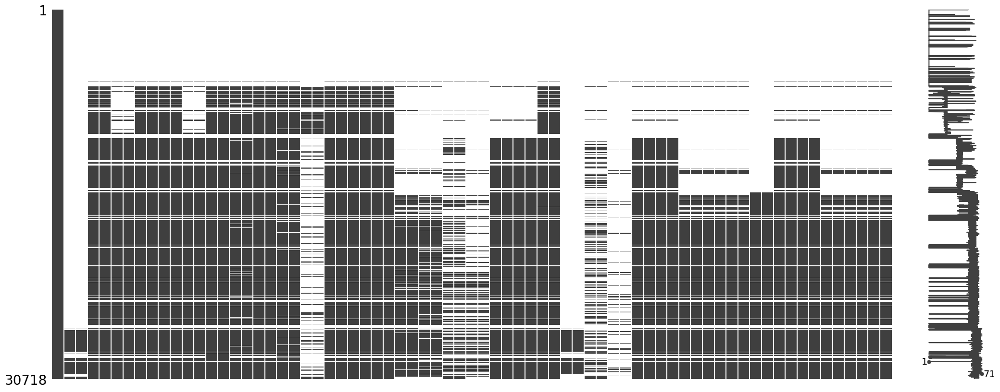

In [25]:
msno.matrix(matches_statistics.sort_values(by="id", ascending=True))
plt.show()

**Why does our dataset have a significant number of missing values?**

  Let's begin our analysis by visualizing the missing data across countries and seasons. This will provide insights into potential patterns and guide our investigation.

In [26]:
matches_results = pd.read_csv("football_data/clean_matches_results.csv")

matches_data = matches_results.merge(matches_statistics, on="id")
matches_data.sample()

,id,customId,startTimestamp,season,country,tournament,round_s,home_team,away_team,home_score,...,home_duels_won,away_duels_won,home_aerials_won,away_aerials_won,home_tackles,away_tackles,home_interceptions,away_interceptions,home_clearances,away_clearances
7030,1763667,QHsgI,2012-04-27 19:00:00+00:00,11/12,France,Ligue 1,34,Lorient,Olympique de Marseille,2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [27]:
def null_values_ratio(window):
  total_cells = window.size - 17 * window.shape[0]
  null_cells = window.isna().sum(axis=1).sum(axis=0)
  return round(null_cells / total_cells, 2) * 100

mv_x_cs = matches_data.groupby(["country", "season"]) \
                      .apply(null_values_ratio)\
                      .rename("null values ratio") \
                      .reset_index()

In [28]:
fig = px.scatter(mv_x_cs, x="season", y="country", color="country",
                 size='null values ratio', hover_data=['null values ratio'],
                 title="Null Values Ratio (%)")

fig.show()

We can observe that during the period from 2010/11 to 2012/13 seasons, there were a significant number of null values or missing statistics for most countries. However, beyond the 2013/14 season, the ratio of null values has decreased considerably for the majority of countries, except for Morocco. The data suggests that the Sofascore platform did not start recording statistics for the Moroccan league until the 2022/23 season, which is the current season.

To solve this problem, we will drop the rows where all the statistics are missing.

In [29]:
non_null_rows = matches_statistics.iloc[:, 1:].dropna(how="all", axis=0).index
matches_statistics = matches_statistics.iloc[non_null_rows]


### Ball Possession Analyse

In [30]:
fig = px.box(matches_statistics, y=["home_possession", "away_possession"])
fig.show()

even in the ball possession home teams overperform the away teams.

### Defence Analyse

#### Ball Interception

An interception is a defensive action where a player anticipates and cuts off an opponent's pass or intended movement with the ball. The player intercepts or gains possession of the ball before it reaches its intended target.

In [31]:
fig = px.box(matches_statistics, y=["home_interceptions", "away_interceptions"])
fig.show()

#### Ball Clearances

A clearance is a defensive action where a player kicks or heads the ball away from their team's goal area to relieve pressure and clear the immediate danger. Clearances are typically made by defenders or goalkeepers when the ball is in or around their penalty area, and they need to get rid of the ball quickly to prevent the opposition from taking a shot or scoring.

In [32]:
fig = px.box(matches_statistics, y=["home_clearances", "away_clearances"])
fig.show()

#### Tackles

In [33]:
fig = px.box(matches_statistics, y=["home_tackles", "away_tackles"])
fig.show()

Based on the three boxplots visualizing defensive statistics such as clearances, interceptions, and tackles, the data suggests that the away team tends to perform marginally better than the home team in terms of defensive actions and ball recoveries.

### Save the cleaned data

In [34]:
matches_statistics.to_csv("football_data/clean_matches_statistics.csv", index=False)

## Matches Highlights DataFrame

In [37]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)

import json
with open("football_data/matches_highlights.json", "r", encoding="utf8") as f:
   dict_data = []
   for line in f:
      dict_data.append(json.loads(line))

In [39]:
matches_highlights = pd.json_normalize(dict_data)
matches_highlights.head(1)

,id,highlights.injuryTime,highlights.penaltyShootout,highlights.substitution,highlights.card,highlights.goal
0,7490673,"[{'time': '90', 'length': '4'}]",[],"[{'time': '86', 'isHome': False, 'playerIn': {'name': 'Miguel Ángel Guerrero', 'position': 'F', 'jerseyNumber': '10'}, 'playerOut': {'name': 'Claudio Beauvue', 'position': 'F', 'jerseyNumber': '9'}, 'type': 'regular'}, {'time': '82', 'isHome': False, 'playerIn': {'name': 'Raúl Carnero', 'position': 'D'}, 'playerOut': {'name': 'Nabil El Zhar', 'position': 'M'}, 'type': 'regular'}, {'time': '76', 'isHome': True, 'playerIn': {'name': 'Nano Mesa', 'position': 'F'}, 'playerOut': {'name': 'José Campaña', 'position': 'M', 'jerseyNumber': '21'}, 'type': 'regular'}, {'time': '74', 'isHome': True, 'playerIn': {'name': 'Ivi López', 'position': 'F', 'jerseyNumber': '11'}, 'playerOut': {'name': 'Pedro López', 'position': 'D', 'jerseyNumber': '19'}, 'type': 'regular'}, {'time': '57', 'isHome': True, 'playerIn': {'name': 'Enis Bardhi', 'position': 'M', 'jerseyNumber': '8'}, 'playerOut': {'name': 'Saša Lukić', 'position': 'M', 'jerseyNumber': '28'}, 'type': 'regular'}]","[{'time': '90', 'isHome': True, 'player': {'name': 'Erick Cabaco', 'position': 'D', 'jerseyNumber': '18'}, 'type': 'yellow', 'rescinded': False, 'reason': 'Argument'}, {'time': '90', 'isHome': True, 'player': {'name': 'José Campaña', 'position': 'M', 'jerseyNumber': '21'}, 'type': 'yellowRed', 'rescinded': False, 'reason': 'Argument'}, {'time': '90', 'isHome': True, 'player': {'name': 'José Luis Morales', 'position': 'F', 'jerseyNumber': '15'}, 'type': 'yellow', 'rescinded': False, 'reason': 'Argument'}, {'time': '80', 'isHome': False, 'player': {'name': 'Claudio Beauvue', 'position': 'F', 'jerseyNumber': '9'}, 'type': 'yellow', 'rescinded': False, 'reason': 'Off the ball foul'}, {'time': '77', 'isHome': True, 'player': {'name': 'Enis Bardhi', 'position': 'M', 'jerseyNumber': '8'}, 'type': 'yellow', 'rescinded': False, 'reason': 'Simulation'}, {'time': '68', 'isHome': False, 'player': {'name': 'Nordin Amrabat', 'position': 'M', 'jerseyNumber': '5'}, 'type': 'yellowRed', 'rescinded': False, 'reason': 'Foul'}, {'time': '68', 'isHome': False, 'player': {'name': 'Joseba Zaldúa', 'position': 'D', 'jerseyNumber': '2'}, 'type': 'yellow', 'rescinded': False, 'reason': 'Argument'}, {'time': '63', 'isHome': False, 'player': {'name': 'Nordin Amrabat', 'position': 'M', 'jerseyNumber': '5'}, 'type': 'yellow', 'rescinded': False, 'reason': 'Foul'}, {'time': '61', 'isHome': False, 'player': {'name': 'Gerard Gumbau', 'position': 'M', 'jerseyNumber': '23'}, 'type': 'yellow', 'rescinded': False, 'reason': 'Persistent fouling'}, {'time': '50', 'isHome': True, 'player': {'name': 'José Campaña', 'position': 'M', 'jerseyNumber': '21'}, 'type': 'yellow', 'rescinded': False, 'reason': 'Argument'}, {'time': '35', 'isHome': True, 'player': {'name': 'Jefferson Lerma', 'position': 'M', 'jerseyNumber': '8'}, 'type': 'yellow', 'rescinded': False, 'reason': 'Foul'}, {'time': '23', 'isHome': False, 'player': {'name': 'Mauro Dos Santos', 'position': 'D', 'jerseyNumber': '3'}, 'type': 'yellow', 'rescinded': False, 'reason': 'Foul'}]",[]


In [40]:
matches_highlights.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30827 entries, 0 to 30826
Data columns (total 6 columns):
 #   Column                      Non-Null Count  Dtype 
---  ------                      --------------  ----- 
 0   id                          30827 non-null  object
 1   highlights.injuryTime       25812 non-null  object
 2   highlights.penaltyShootout  25812 non-null  object
 3   highlights.substitution     25812 non-null  object
 4   highlights.card             25812 non-null  object
 5   highlights.goal             25812 non-null  object
dtypes: object(6)
memory usage: 1.4+ MB


The fields in the provided JSON schema represent nested data structures. Each field is a record (struct) that contains other records (structs) and repeated records (lists) as its sub-fields. This nested nature of the data makes it challenging to work with directly. Consequently, to simplify the data and make it more manageable, we should normalize it. One approach to normalize this data is to divide the core record into separate tables, such as a goals table, cards table, substitutions table, and so on, where each table represents a specific entity or concept from the original data structure.

### Goal Table

In [41]:
goal_df = pd.json_normalize(
    matches_highlights[["id", "highlights.goal"]].to_dict("records"),
    meta="id",
    record_path=["highlights.goal"],
)
goal_df.head(2)

,homeScore,awayScore,time,isHome,type,player.name,player.position,player.jerseyNumber,assist.name,assist.position,assist.jerseyNumber,id
0,0,1,9,False,regular,Rubén Alcaraz,M,4,Rubén Sobrino,M,7,10408327
1,0,1,4,False,regular,Rubén Castro,F,NaN,Joaquín,M,NaN,6807485


In [42]:
goal_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70509 entries, 0 to 70508
Data columns (total 12 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   homeScore            70509 non-null  object
 1   awayScore            70509 non-null  object
 2   time                 70509 non-null  object
 3   isHome               70509 non-null  bool  
 4   type                 70509 non-null  object
 5   player.name          68324 non-null  object
 6   player.position      68310 non-null  object
 7   player.jerseyNumber  58317 non-null  object
 8   assist.name          38651 non-null  object
 9   assist.position      38648 non-null  object
 10  assist.jerseyNumber  34284 non-null  object
 11  id                   70509 non-null  object
dtypes: bool(1), object(11)
memory usage: 6.0+ MB


| Field | Explanation |
|-------|--------------|
| `homeScore` | The score of the home team at the time of the event. |
| `awayScore` | The score of the away team at the time of the event. |
| `time` | The time (in minutes or seconds) when the event occurred during the match. |
| `isHome` | Indicates whether the event was related to the home team or the away team. |
| `type` | The type of event, such as a regular goal, penalty, or ownGoal. |
| `player.name` | The name of the player involved in the event. |
| `player.position` | The playing position of the player involved in the event. |
| `player.jerseyNumber` | The jersey number of the player involved in the event. |
| `assist.name` | The name of the player who provided the assist for a goal event. |
| `assist.position` | The playing position of the player who provided the assist. |
| `assist.jerseyNumber` | The jersey number of the player who provided the assist. |

#### Redundancy

In [43]:
print("The number of duplicated values is: ", goal_df.duplicated().sum())

The number of duplicated values is:  304


In [44]:
goal_df = goal_df.drop_duplicates()
print("The number of duplicated values now is: ", goal_df.duplicated().sum())

The number of duplicated values now is:  0


#### Misssing Values

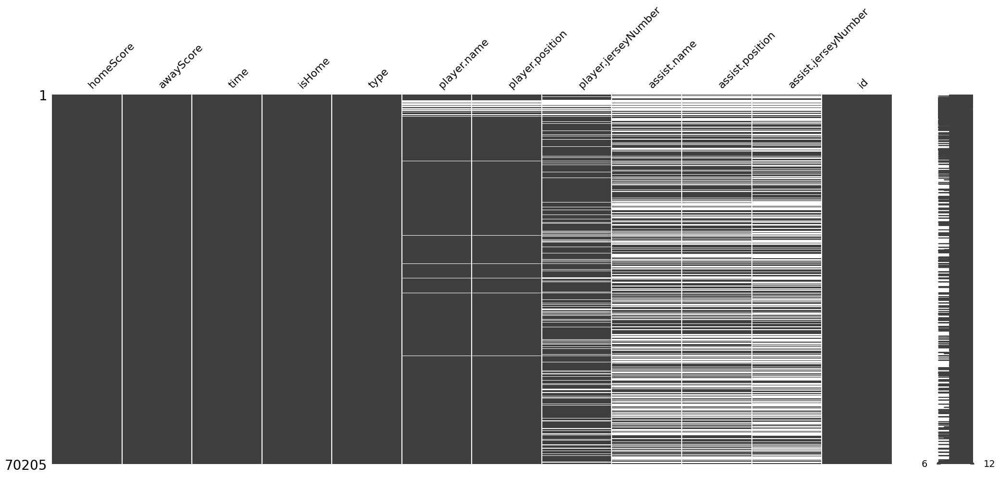

In [45]:
msno.matrix(goal_df)
plt.show()

The fields related to assists have the highest number of missing values, but this is expected since not every goal involved an assist.

let's now drop the rows whose all the fields are missing.

In [46]:
goal_df = goal_df.dropna(how="all")

#### Correct Data Type

In [47]:
goal_df["homeScore"] = goal_df["homeScore"].astype("int64")
goal_df["awayScore"] = goal_df["awayScore"].astype("int64")
goal_df["time"] = goal_df["time"].astype("int64")

#### time range and goals distribution

In [48]:
goal_df["time"].describe().astype("int64")

count    70205
mean        50
std         26
min          1
25%         29
50%         52
75%         74
max        120
Name: time, dtype: int64

based on the stats above, the fastest goal in goal_df has been scored at the first minute, the latest goal has been scored at the 118 minute, wich means at the second extra time.

In [49]:
fig = px.histogram(goal_df, x="time")
fig.show()

Surprisingly, the highest number of goals are scored in stoppage time at the end of each half (90+ and 45+ minutes). However, aside from these peak periods, the histogram indicates a generally uniform distribution of goals throughout the rest of the original match. the number of goals beyond the minute 90 is not important as we scraped mainly the leagues, so there is just a small number of matches that reached the extra time.

#### `Type` Field values

In [50]:
goal_df["type"].unique()

array(['regular', 'penalty', 'ownGoal', 'goal'], dtype=object)

The 'type' field includes four values: 'regular', 'goal', 'ownGoal', and 'penalty'.  The terms 'goal' and 'regular' are redundant, as they both indicate a standard goal. To streamline this, let's merge the 'goal' type into the 'regular' category.

In [51]:
goal_df["type"] = goal_df["type"].replace("goal", "regular")

In [52]:
fig = px.histogram(goal_df, x="type", color="type", barmode="group", title="Number of Goals per Type")
fig.show()

#### `Position` Field Values

In [53]:
goal_df["player.position"].unique()

array(['M', 'F', 'D', nan, 'G'], dtype=object)

- **M:** Midfielder
- **F**: Forward
- **D**: Defender
- **G**: Goalkeeper

let's visualize the number of goals per player position

In [54]:
goals_per_pos = goal_df.groupby("player.position")["id"] \
                       .count() \
                       .rename("goals per position") \
                       .reset_index() \
                       .sort_values(by="goals per position", ascending=False) \

fig = px.histogram(goals_per_pos, x="player.position", y="goals per position", color="player.position", title="Number of Goals per position")
fig.show()

As expected, attackers dominate goal-scoring compared to other positions. Midfielders follow in second place, and defenders come third. Surprisingly, goalkeepers have scored over 180 goals, highlighting an unexpected scoring contribution.

#### Save Goals DataFrame

In [55]:
goal_df.to_csv("football_data/goals.csv", index=False)

### Injury Time Table

Injury time, also known as stoppage time or added time, is the additional playing time added at the end of each half (first half and second half) in soccer/football matches to compensate for time lost due to stoppages in play.

In [56]:
injuryTime_df = pd.json_normalize(
    matches_highlights[["id", "highlights.injuryTime"]].to_dict("records"),
    meta="id",
    record_path=["highlights.injuryTime"],
)
injuryTime_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38148 entries, 0 to 38147
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   time    38148 non-null  object
 1   length  38148 non-null  object
 2   id      38148 non-null  object
dtypes: object(3)
memory usage: 894.2+ KB


#### Missing Values

<Axes: >

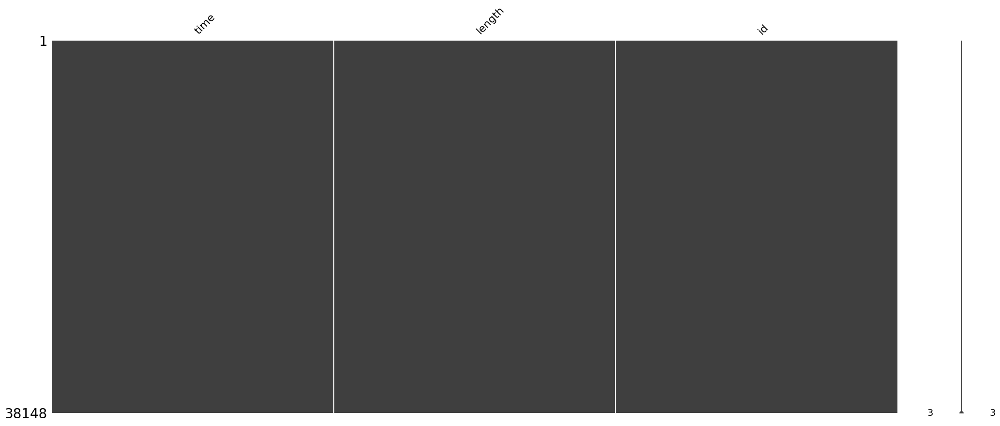

In [57]:
msno.matrix(injuryTime_df)

We could notice that there is no missing values

#### Redundancy

In [58]:
injuryTime_df.duplicated().sum()

218

In [59]:
injuryTime_df = injuryTime_df.drop_duplicates()

#### Save InjuryTime DataFrame

In [60]:
injuryTime_df.to_csv("football_data/injury_time.csv", index=False)

### Other Tables

We will exclusively use goals and injury_time table for our analysis.